In [ ]:
!pip install yolov5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.4/953.4 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.1/800.1 kB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 9.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.6/113.6 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.2/76.2 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 55.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.

In [ ]:
import cv2
import numpy as np
from yolov5 import YOLOv5
import subprocess
import torch
from IPython.display import Video

In [ ]:
model =YOLOv5("yolov5m.pt")

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['pillow>=10.3.0', 'requests>=2.32.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 221.4 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 11.2s, installed 2 packages: ['pillow>=10.3.0', 'requests>=2.32.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-7-11 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 130MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
!python train.py --data coco.yaml --epochs 300 --weights '/content/yolov5m.pt' --cfg yolov5m.yaml  --batch-size 128

In [ ]:
video_path = '/content/1.mp4'

In [ ]:
cap = cv2.VideoCapture(video_path)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter('output.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform detection
    results = model.predict(frame)
    detections = results.xyxy[0].cpu().numpy()
    classes = results.names

    # Find the index for 'person' class
    person_class_index = list(classes.values()).index('person')

    # Filter for person class
    person_detections = [det for det in detections if int(det[5]) == person_class_index]

    # Count the number of persons detected
    person_count = len(person_detections)

    # Display the count on the frame
    cv2.putText(frame, f'Persons: {person_count}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Draw bounding boxes and labels for person class
    for det in person_detections:
        x1, y1, x2, y2, conf, cls = det
        label = f"{classes[int(cls)]} {conf:.2f}"
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to the output video
    out.write(frame)


WARNING ⚠️ NMS time limit 0.550s exceeded


In [ ]:
cap.release()
out.release()

In [ ]:
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', 'output.mp4', 'output_display.mp4'])
Video("output_display.mp4", embed=True, width=960)

In [ ]:
video_path = '/content/2.mp4'

In [ ]:
cap = cv2.VideoCapture(video_path)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter('output2.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform detection
    results = model.predict(frame)
    detections = results.xyxy[0].cpu().numpy()
    classes = results.names

    # Find the index for 'person' class
    person_class_index = list(classes.values()).index('person')

    # Filter for person class
    person_detections = [det for det in detections if int(det[5]) == person_class_index]

    # Count the number of persons detected
    person_count = len(person_detections)

    # Display the count on the frame
    cv2.putText(frame, f'Persons: {person_count}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Draw bounding boxes and labels for person class
    for det in person_detections:
        x1, y1, x2, y2, conf, cls = det
        label = f"{classes[int(cls)]} {conf:.2f}"
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to the output video
    out.write(frame)

cap.release()
out.release()

In [ ]:
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', 'output2.mp4', 'output_display2.mp4'])
Video("output_display2.mp4", embed=True, width=960)

In [ ]:
video_path = '/content/3.mp4'

In [ ]:
cap = cv2.VideoCapture(video_path)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

out = cv2.VideoWriter('output3.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform detection
    results = model.predict(frame)
    detections = results.xyxy[0].cpu().numpy()
    classes = results.names

    # Find the index for 'person' class
    person_class_index = list(classes.values()).index('person')

    # Filter for person class
    person_detections = [det for det in detections if int(det[5]) == person_class_index]

    # Count the number of persons detected
    person_count = len(person_detections)

    # Display the count on the frame
    cv2.putText(frame, f'Persons: {person_count}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Draw bounding boxes and labels for person class
    for det in person_detections:
        x1, y1, x2, y2, conf, cls = det
        label = f"{classes[int(cls)]} {conf:.2f}"
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to the output video
    out.write(frame)

cap.release()
out.release()

NameError: name 'cv2' is not defined

In [ ]:
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', 'output3.mp4', 'output_display3.mp4'])
Video("output_display3.mp4", embed=True, width=960)

In [ ]:
def process_image(image_path):
    image = cv2.imread(image_path)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    results = model(image_rgb)
    detections = results.xyxy[0].cpu().numpy()
    classes = results.names

    person_class_index = list(classes.values()).index('person')

    person_detections = [det for det in detections if int(det[5]) == person_class_index]

    person_count = len(person_detections)

    cv2.putText(image, f'Persons: {person_count}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    for det in person_detections:
        x1, y1, x2, y2, conf, cls = det
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

    print('Number of people:',person_count)
    return image

In [ ]:
image_path='/content/1.jpg'
img=process_image(image_path)

Number of people: 14


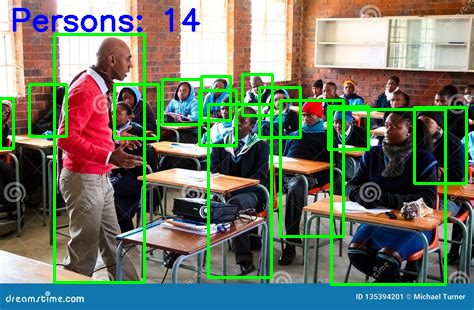

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
image_path='/content/2.jpg'
img=process_image(image_path)

Number of people: 14


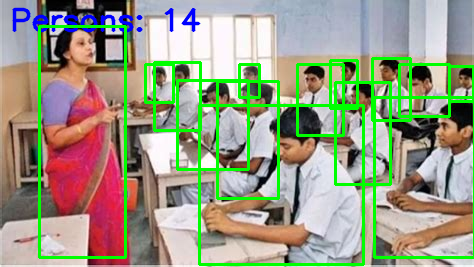

In [ ]:
cv2_imshow(img)

In [ ]:
image_path='/content/3.jpg'
img=process_image(image_path)

Number of people: 10


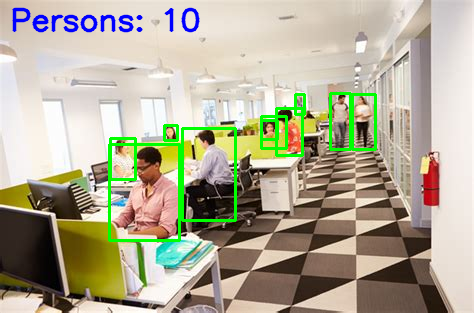

In [ ]:
cv2_imshow(img)

In [ ]:
image_path='/content/4.jpg'
img=process_image(image_path)

Number of people: 5


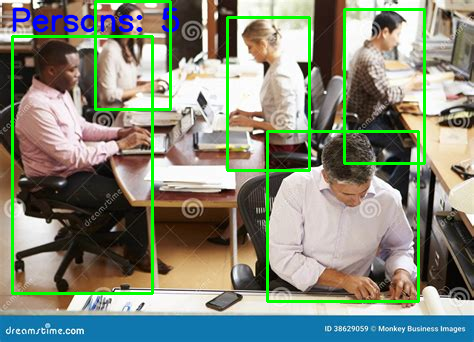

In [ ]:
cv2_imshow(img)